In [2]:
import PIL.Image as Image
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

In [3]:
def compute_cosine_affinity_matrix(embeddings , type = 'cosine' , sigma = 0.1):
	"""Compute the affinity matrix from data.

	Note that the range of affinity is [0, 1].

	Args:
		embeddings: numpy array of shape (n_samples, n_features)

	Returns:
		affinity: numpy array of shape (n_samples, n_samples)
	"""
	if type == 'cosine':
		  # Normalize the data.
		l2_norms = np.linalg.norm(embeddings, axis=1)
		embeddings_normalized = embeddings / (l2_norms[:, None] + 1e-6)
		# Compute cosine similarities. Range is [-1,1].
		cosine_similarities = np.matmul(embeddings_normalized,np.transpose(embeddings_normalized))
		# Compute the affinity. Range is [0,1].
		# Note that this step is not mentioned in the paper!
		affinity = (cosine_similarities + 1.0) / 2.0

		affinity = affinity - np.identity(affinity.shape[0])
		return affinity
	elif type == 'gaussian':
		# Compute the pairwise distance matrix.
		pairwise_distances = np.linalg.norm(embeddings[:, None, :] - embeddings[None, :, :], axis=-1)
		pairwise_distances  = pairwise_distances +  np.diag(np.inf*np.ones(pairwise_distances.shape[0]))
    
		# Compute the affinity matrix.
		affinity = np.exp(-pairwise_distances / (2.0 * sigma))
		return affinity
	else:
		raise ValueError("Unsupported affinity type.")


class Custom_CV:
    def padding(img, kernelsize, mode="reflect"):
        # padding
        padx = kernelsize[0] - 1
        pady = kernelsize[1] - 1
        padded_img = np.zeros((img.shape[0] + padx, img.shape[1] + pady))
        padded_img[
            padx // 2 : img.shape[0] + padx // 2, pady // 2 : img.shape[1] + pady // 2
        ] = img

        if mode == "reflect":
            if pady > 0:
                padded_img[:, 0 : pady // 2] = padded_img[:, slice(pady // 2, 0, -1)]
                padded_img[:, -pady // 2 :] = padded_img[
                    :, slice(-pady // 2 - 1, -1, 1)
                ]

            if padx > 0:
                padded_img[0 : padx // 2, :] = padded_img[slice(padx // 2, 0, -1), :]
                padded_img[-padx // 2 :, :] = padded_img[
                    slice(-padx // 2 - 1, -1, 1), :
                ]
        elif mode == "zero":
            pass
        return padded_img

    @staticmethod
    def apply_convolution(img, kernel):
        kernelsize_x, kernelsize_y = kernel.shape
        image_height, image_width = img.shape
        padded_img = Custom_CV.padding(img, kernel.shape)
        conv_img = np.zeros_like(img)

        # convolution
        for i in range(kernelsize_x):
            for j in range(kernelsize_y):
                conv_img += (
                    padded_img[i : image_height + i, j : image_width + j] * kernel[i, j]
                )
        return conv_img    
    def gaussian_blur(img, ksize, sigma):
            if ksize==0:
                ksize = 2*round(4.0 * sigma) + 1
            
            if sigma == 0:
                sigma = 0.3 * ((ksize - 1) * 0.5 - 1) + 0.8
            
            kernelx = np.zeros((ksize,))
            for i in range(ksize):
                kernelx[i] = np.exp(-((i - 1) ** 2) / (2 * sigma**2))
            
            kernelx = kernelx.reshape(1, -1)
            kernely = kernelx.reshape(-1, 1)
            convx = Custom_CV.apply_convolution(img, kernelx)
            convxy = Custom_CV.apply_convolution(convx, kernely)
            return convxy
    
def crop_diag( affinity: np.ndarray) -> np.ndarray:
    refined_affinity = np.copy(affinity)
    np.fill_diagonal(refined_affinity, 0.0)
    di = np.diag_indices(refined_affinity.shape[0])
    refined_affinity[di] = refined_affinity.max(axis=1)
    return refined_affinity 

class RowWiseThreshold():
  """Apply row wise thresholding."""

  def __init__(self,
               p_percentile: float = 0.95,
               thresholding_soft_multiplier: float = 0.01,
               thresholding_type= "RowMax",
               thresholding_with_binarization: bool = False,
               thresholding_preserve_diagonal: bool = False):
    self.p_percentile = p_percentile
    self.multiplier = thresholding_soft_multiplier
    if not isinstance(thresholding_type, str):
      raise TypeError("thresholding_type must be a ThresholdType")
    self.thresholding_type = thresholding_type
    self.thresholding_with_binarization = thresholding_with_binarization
    self.thresholding_preserve_diagonal = thresholding_preserve_diagonal

  def refine(self, affinity: np.ndarray) -> np.ndarray:
    # self.check_input(affinity)
    refined_affinity = np.copy(affinity)
    if self.thresholding_preserve_diagonal:
      np.fill_diagonal(refined_affinity, 0.0)
    if self.thresholding_type == "RowMax":
      # Row_max based thresholding
      row_max = refined_affinity.max(axis=1)
      row_max = np.expand_dims(row_max, axis=1)
      is_smaller = refined_affinity < (row_max * self.p_percentile)
    elif self.thresholding_type == "Percentile":
      # Percentile based thresholding
      row_percentile = np.percentile(
          refined_affinity, self.p_percentile * 100, axis=1)
      row_percentile = np.expand_dims(row_percentile, axis=1)
      is_smaller = refined_affinity < row_percentile
    else:
      raise ValueError("Unsupported thresholding_type")
    if self.thresholding_with_binarization:
      # For values larger than the threshold, we binarize them to 1
      refined_affinity = (np.ones_like(
          (refined_affinity)) * np.invert(is_smaller)) + (
              refined_affinity * self.multiplier * is_smaller)
    else:
      refined_affinity = (refined_affinity * np.invert(is_smaller)) + (
          refined_affinity * self.multiplier * is_smaller)
    if self.thresholding_preserve_diagonal:
      np.fill_diagonal(refined_affinity, 1.0)
    return refined_affinity
  
class Symmetrize():
  """The Symmetrization operation."""

  def __init__(self, symmetrize_type = 'Max'):
    self.symmetrize_type = symmetrize_type

  def refine(self, affinity: np.ndarray) -> np.ndarray:
    # self.check_input(affinity)
    if self.symmetrize_type == 'Max':
      return np.maximum(affinity, np.transpose(affinity))
    elif self.symmetrize_type == 'Average':
      return 0.5 * (affinity + np.transpose(affinity))
    else:
      raise ValueError("Unsupported symmetrize_type.")

class Diffuse():
  """The diffusion operation."""

  def refine(self, affinity: np.ndarray) -> np.ndarray:
    # self.check_input(affinity)
    return np.matmul(affinity, np.transpose(affinity))
  
class RowWiseNormalize():
  """The row wise max normalization operation."""

  def refine(self, affinity: np.ndarray) -> np.ndarray:
    # self.check_input(affinity)
    refined_affinity = np.copy(affinity)
    row_max = refined_affinity.max(axis=1)
    refined_affinity /= np.expand_dims(row_max, axis=1)
    return refined_affinity


In [4]:
def RatioCut(image:np.ndarray, n_clusters = 3, affinity_type = 'gaussian', sigma = 0.5, K = 5 ,sigma_gaussian_blur = 1, p_percentile = 0.95, thresholding_soft_multiplier = 0.01, thresholding_type= "RowMax", thresholding_with_binarization: bool = False, thresholding_preserve_diagonal: bool = False, symmetrize_type = 'Max'):
    '''
    # RatioCut Clustering 

    Note: All the Affine Matrix Refinement Steps taken from the following paper and github:
        paper link: https://google.github.io/speaker-id/publications/LstmDiarization/ 
        github: https://github.com/wq2012/SpectralCluster

    ## Args:
        image : 
            Image to be clustered, shape (height,width,channels)        
        n_clusters : 
            Number of clusters
        affinity_type : 
            Type of affinity matrix, 'cosine' or 'gaussian'
        sigma : 
            Sigma for Gaussian Affinity Matrix, if affinity_type is gaussian
        K : 
            Number of Eigen Vectors to consider for Clustering
        sigma_gaussian_blur : 
            Sigma for Gaussian Blur, range > 0
        p_percentile :
             Percentile for Row Wise Thresholding, range [0,1]
        thresholding_soft_multiplier :
             Multiplier for Soft Thresholding, range > 0
        thresholding_type :
             Type of Thresholding, 'RowMax' or 'Percentile'
        thresholding_with_binarization :
             Binarization after Thresholding, True or False
        thresholding_preserve_diagonal :
             Preserve Diagonal after Thresholding, True or False
        symmetrize_type :
             Type of Symmetrization, 'Max' or 'Average'
    '''
    height = image.shape[0]
    width = image.shape[1]
    channels = image.shape[2]
    image = np.array(image,dtype=float)
    image_ravel = image.reshape(height*width , channels) 
    affinity = compute_cosine_affinity_matrix(image_ravel, type = affinity_type , sigma = sigma)

    # affinity Matrix Refinement
    plt.figure(figsize=(16, 16))
    plt.subplot(3, 3, 1)
    plt.imshow(affinity,cmap='gray')
    plt.title(f'Affinity Matrix, $ type = {affinity_type} $' + f', $ \\sigma = {sigma} $' if affinity_type == 'gaussian' else '')

    plt.subplot(3, 3, 2)
    affinity = crop_diag(affinity)
    plt.imshow(affinity,cmap='gray')
    plt.title('Affinity Matrix cropped')
    
    plt.subplot(3, 3, 3)
    affinity = Custom_CV.gaussian_blur(affinity, 0, sigma_gaussian_blur)
    plt.imshow(affinity,cmap='gray')
    plt.title(f'Affinity Matrix blurred, $ \\sigma = {sigma_gaussian_blur} $')

    plt.subplot(3, 3, 4)
    RWT = RowWiseThreshold(p_percentile, thresholding_soft_multiplier, thresholding_type, thresholding_with_binarization, thresholding_preserve_diagonal)
    affinity = RWT.refine(affinity)
    plt.imshow(affinity,cmap = 'gray')
    plt.title(f'Affinity Matrix thresholded, $ p = {p_percentile} $, $ \\alpha = {thresholding_soft_multiplier} $, \n $ type = {thresholding_type} $, $ binarization = {thresholding_with_binarization} $, $ preserve = {thresholding_preserve_diagonal} $')

    plt.subplot(3, 3, 5)
    sym = Symmetrize(symmetrize_type)
    affinity = sym.refine(affinity) 
    plt.imshow(affinity,cmap = 'gray')
    plt.title('Affinity Matrix symmetrized')
    
    plt.subplot(3, 3, 6)
    diff = Diffuse()
    affinity = diff.refine(affinity)
    plt.imshow(affinity,cmap = 'gray')
    plt.title('Affinity Matrix diffused')

    plt.subplot(3, 3, 7)
    RWN = RowWiseNormalize()
    affinity = RWN.refine(affinity)
    plt.imshow(affinity,cmap = 'gray')
    plt.title('Affinity Matrix normalized')

    # Laplacian Matrix
    D = np.diag(affinity.sum(axis=1))
    # Laplacian  = D - Affinity  
    # random_walk Normalized Laplacian = I - D^(-1/2) * Affinity * D^(-1/2)
    Laplacian = np.identity(height*width) - ( affinity / np.diagonal( D )[:,None] )
    
    # Spectrum
    eigenvalues, eigenvectors = np.linalg.eigh(Laplacian)
    V_K = eigenvectors[:,:K]
    
    # Clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42,n_init='auto',init='k-means++').fit(V_K)
    clusters = kmeans.labels_.reshape(height,width)
    image_resized_clustered = np.zeros_like(image)


    for i in range(n_clusters):
        image_resized_clustered[clusters == i] = image[clusters == i].mean(axis=0)

    plt.subplot(3, 3, 8)
    plt.imshow(image)
    plt.title('Original Image')
    plt.subplot(3, 3, 9)
    plt.imshow(image_resized_clustered)
    plt.title('Clustered Image, K = ' + str(n_clusters))
    plt.show()



# RatioCut Clustering

In [5]:
config_dict = {
    'affinity_type' : ['cosine','gaussian'],
    'sigma' : [0.1,0.5,1],
    'K' : [5,10,20],
    'sigma_gaussian_blur' : [0.1,0.5,1],
    'p_percentile' : [0.95,0.99],
    'thresholding_soft_multiplier' : [0.01,0.1],
    'thresholding_type' : ['RowMax','Percentile'],
    'thresholding_with_binarization' : [True,False],
    'thresholding_preserve_diagonal' : [True,False],
    'symmetrize_type' : ['Max','Average']
}
import itertools
keys, values = zip(*config_dict.items())
experiments = [dict(zip(keys, v)) for v in itertools.product(*values)]
np.random.shuffle(experiments)
print(f'Total Possible Experiments:  {len(experiments)}')


Total Possible Experiments:  3456


Running 5 experiments on each image
Image Path: ./image1.jpg


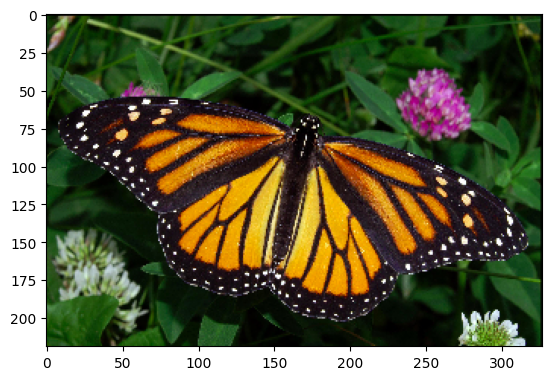

Experiment 1
{'affinity_type': 'gaussian', 'sigma': 0.1, 'K': 5, 'sigma_gaussian_blur': 0.1, 'p_percentile': 0.95, 'thresholding_soft_multiplier': 0.1, 'thresholding_type': 'Percentile', 'thresholding_with_binarization': True, 'thresholding_preserve_diagonal': False, 'symmetrize_type': 'Average'}


C:\Users\KHADGA JYOTH ALLI\AppData\Local\Temp\ipykernel_22772\2939972276.py:167: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(affinity, np.transpose(affinity))


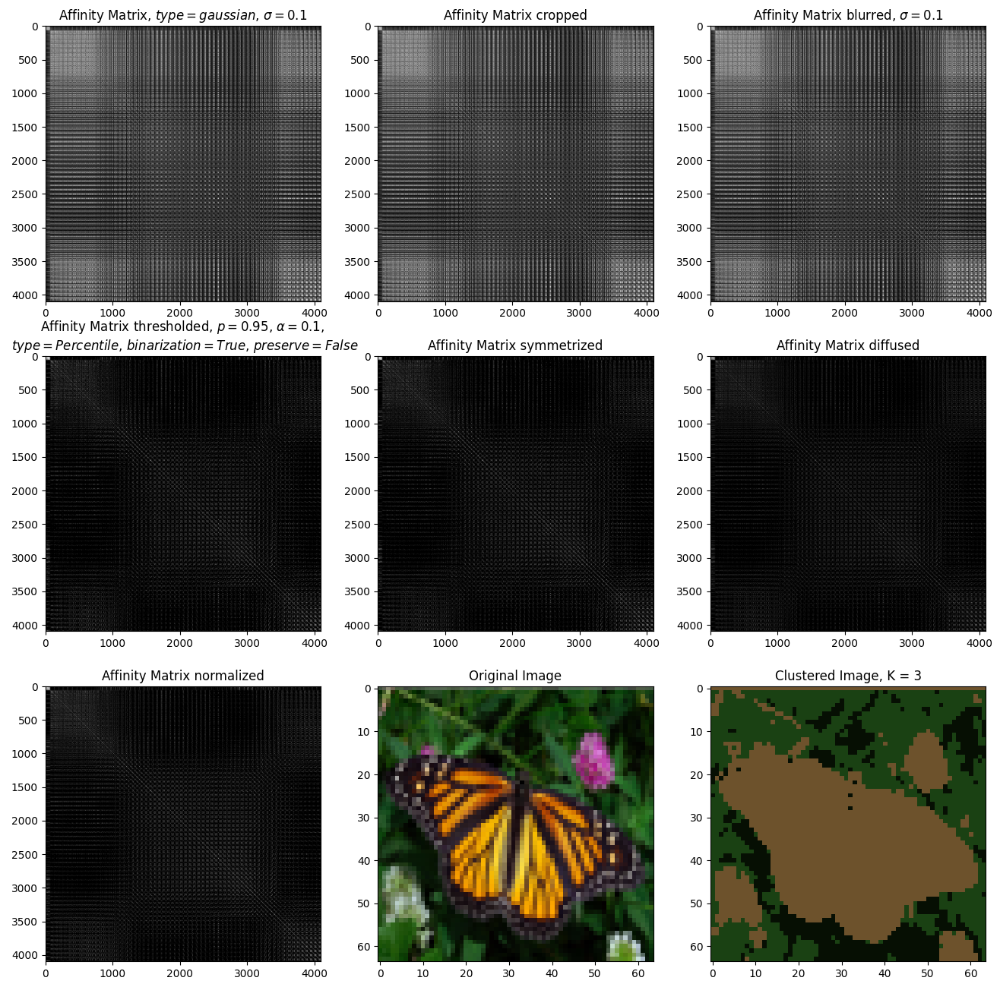



Experiment 2
{'affinity_type': 'gaussian', 'sigma': 0.1, 'K': 5, 'sigma_gaussian_blur': 0.1, 'p_percentile': 0.99, 'thresholding_soft_multiplier': 0.1, 'thresholding_type': 'RowMax', 'thresholding_with_binarization': True, 'thresholding_preserve_diagonal': False, 'symmetrize_type': 'Average'}


C:\Users\KHADGA JYOTH ALLI\AppData\Local\Temp\ipykernel_22772\2939972276.py:167: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(affinity, np.transpose(affinity))


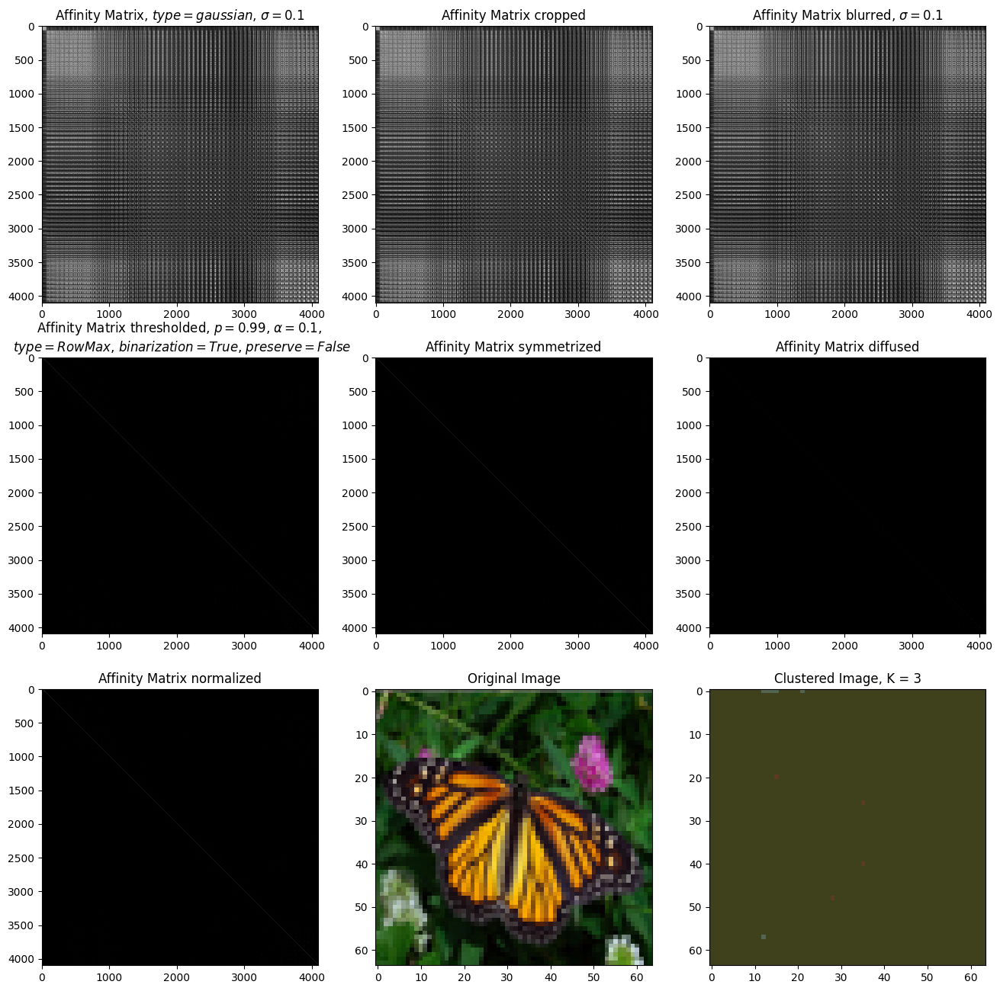



Experiment 3
{'affinity_type': 'gaussian', 'sigma': 1, 'K': 20, 'sigma_gaussian_blur': 1, 'p_percentile': 0.95, 'thresholding_soft_multiplier': 0.01, 'thresholding_type': 'Percentile', 'thresholding_with_binarization': False, 'thresholding_preserve_diagonal': True, 'symmetrize_type': 'Max'}


C:\Users\KHADGA JYOTH ALLI\AppData\Local\Temp\ipykernel_22772\2939972276.py:167: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(affinity, np.transpose(affinity))


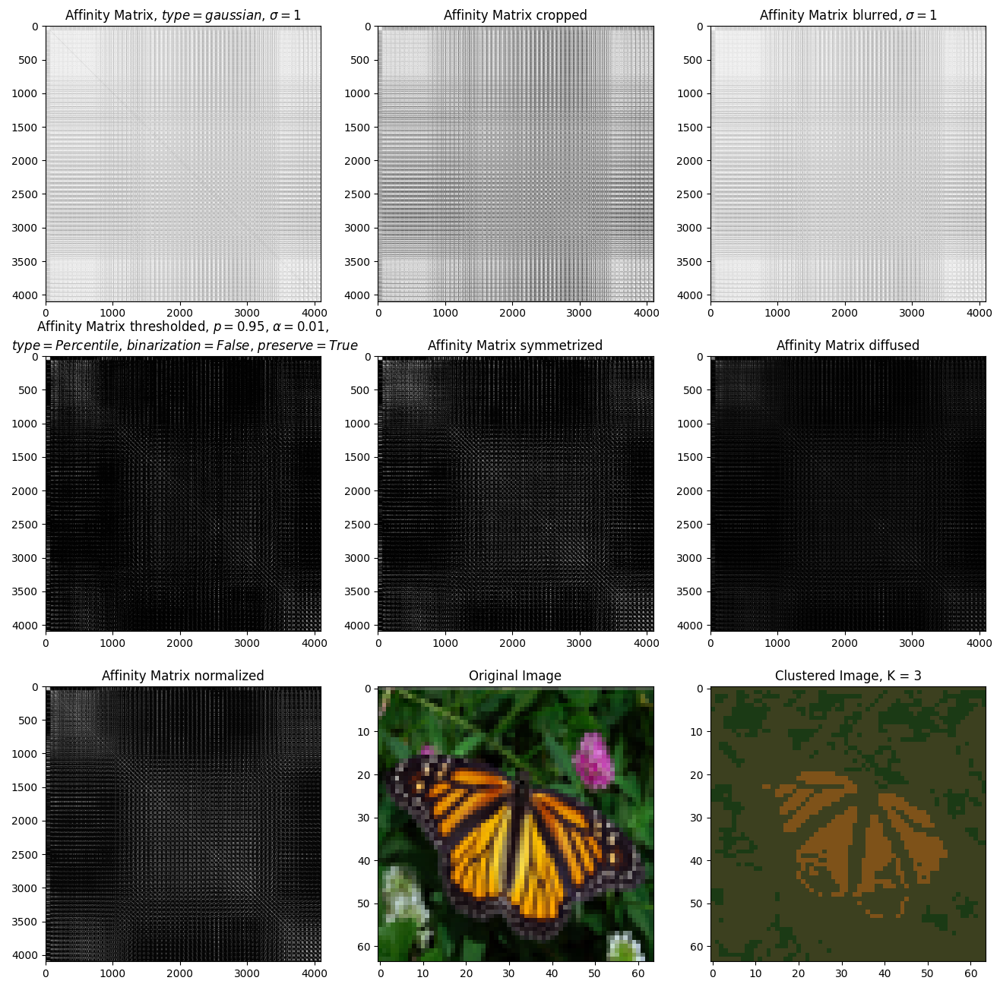



Experiment 4
{'affinity_type': 'cosine', 'sigma': 0.5, 'K': 20, 'sigma_gaussian_blur': 0.5, 'p_percentile': 0.99, 'thresholding_soft_multiplier': 0.01, 'thresholding_type': 'RowMax', 'thresholding_with_binarization': False, 'thresholding_preserve_diagonal': False, 'symmetrize_type': 'Average'}


C:\Users\KHADGA JYOTH ALLI\AppData\Local\Temp\ipykernel_22772\2939972276.py:167: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(affinity, np.transpose(affinity))


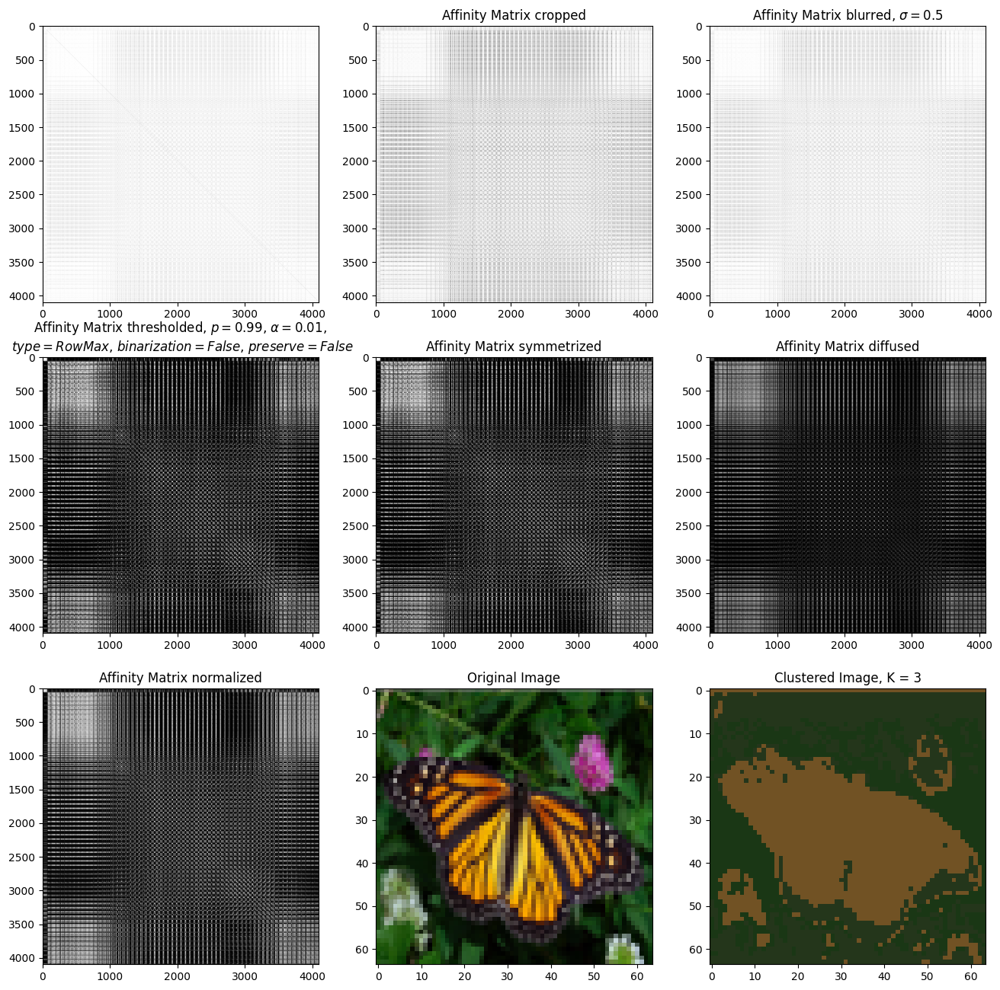



Experiment 5
{'affinity_type': 'gaussian', 'sigma': 0.5, 'K': 10, 'sigma_gaussian_blur': 0.1, 'p_percentile': 0.95, 'thresholding_soft_multiplier': 0.01, 'thresholding_type': 'Percentile', 'thresholding_with_binarization': False, 'thresholding_preserve_diagonal': True, 'symmetrize_type': 'Average'}


C:\Users\KHADGA JYOTH ALLI\AppData\Local\Temp\ipykernel_22772\2939972276.py:167: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(affinity, np.transpose(affinity))


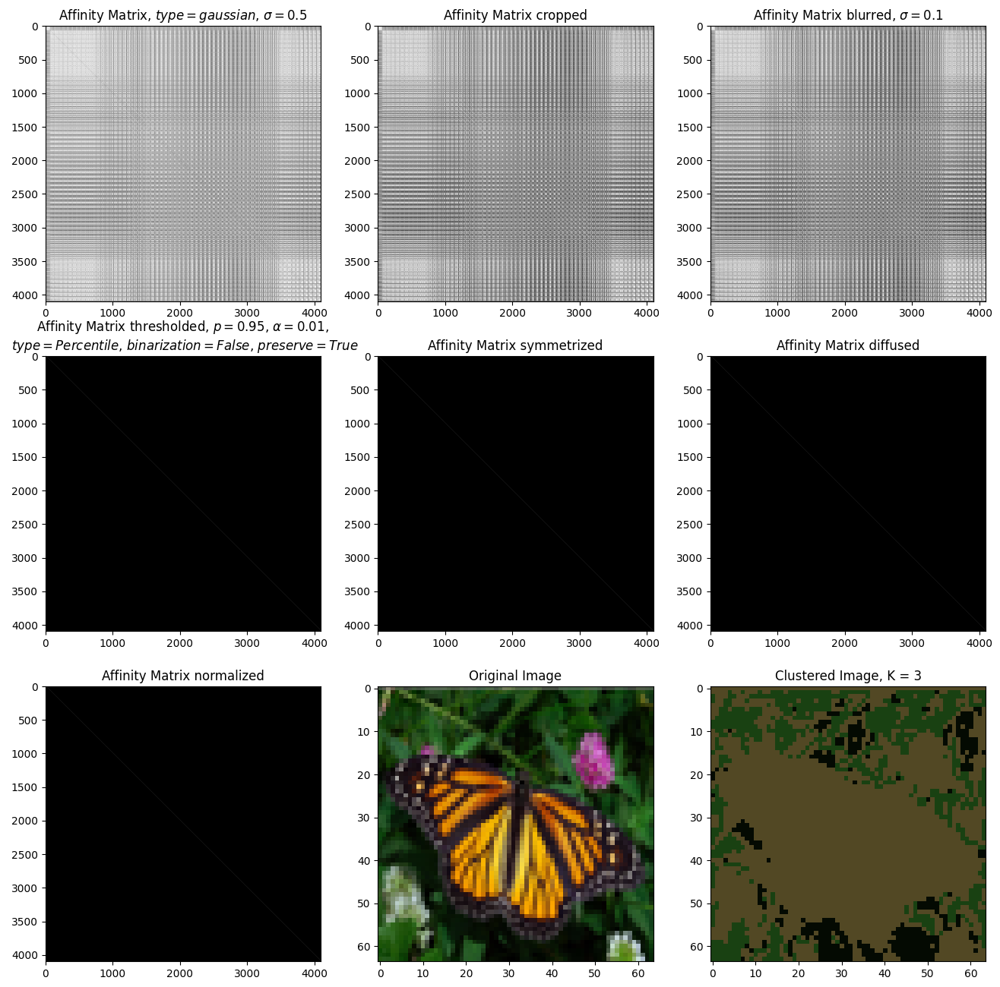



Image Path: ./image2.jpg


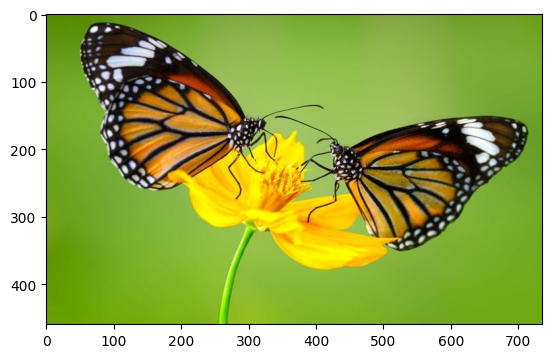

Experiment 1
{'affinity_type': 'gaussian', 'sigma': 0.1, 'K': 5, 'sigma_gaussian_blur': 0.1, 'p_percentile': 0.95, 'thresholding_soft_multiplier': 0.1, 'thresholding_type': 'Percentile', 'thresholding_with_binarization': True, 'thresholding_preserve_diagonal': False, 'symmetrize_type': 'Average'}


C:\Users\KHADGA JYOTH ALLI\AppData\Local\Temp\ipykernel_22772\2939972276.py:167: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(affinity, np.transpose(affinity))


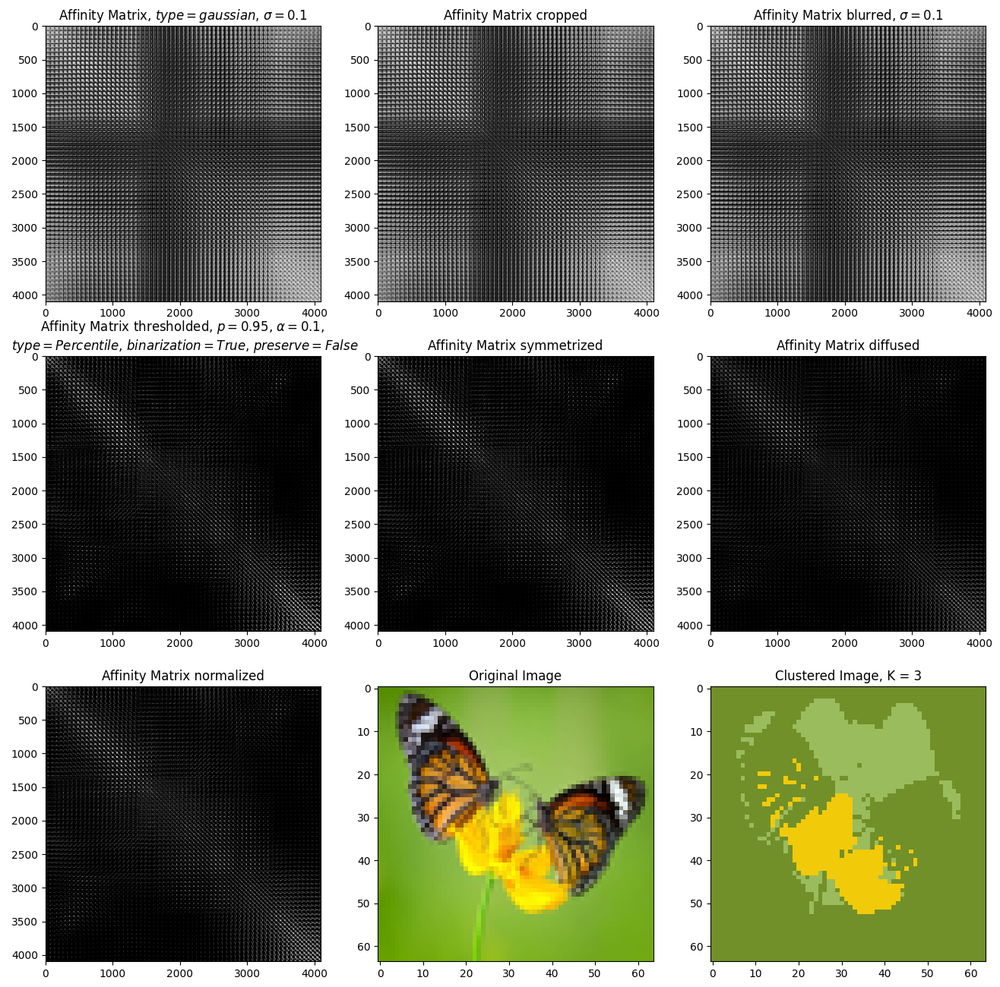



Experiment 2
{'affinity_type': 'gaussian', 'sigma': 0.1, 'K': 5, 'sigma_gaussian_blur': 0.1, 'p_percentile': 0.99, 'thresholding_soft_multiplier': 0.1, 'thresholding_type': 'RowMax', 'thresholding_with_binarization': True, 'thresholding_preserve_diagonal': False, 'symmetrize_type': 'Average'}


C:\Users\KHADGA JYOTH ALLI\AppData\Local\Temp\ipykernel_22772\2939972276.py:167: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(affinity, np.transpose(affinity))


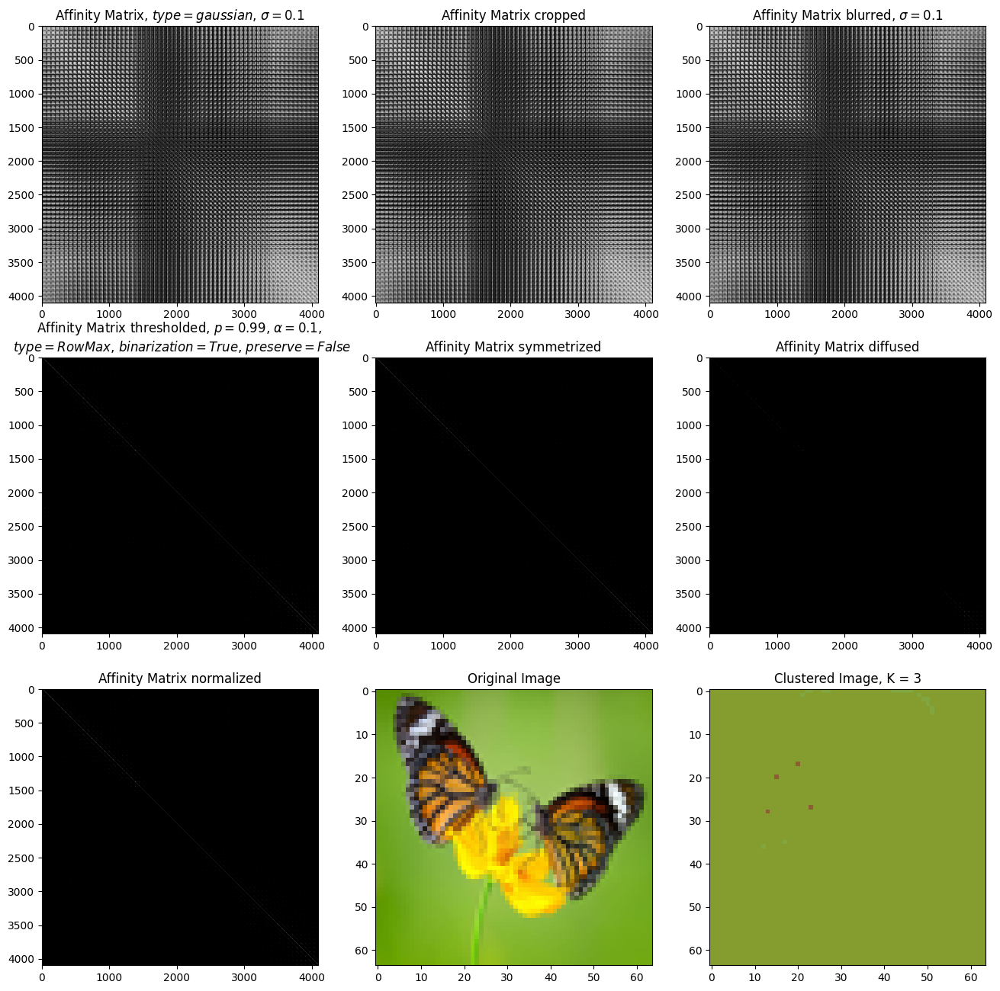



Experiment 3
{'affinity_type': 'gaussian', 'sigma': 1, 'K': 20, 'sigma_gaussian_blur': 1, 'p_percentile': 0.95, 'thresholding_soft_multiplier': 0.01, 'thresholding_type': 'Percentile', 'thresholding_with_binarization': False, 'thresholding_preserve_diagonal': True, 'symmetrize_type': 'Max'}


C:\Users\KHADGA JYOTH ALLI\AppData\Local\Temp\ipykernel_22772\2939972276.py:167: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(affinity, np.transpose(affinity))


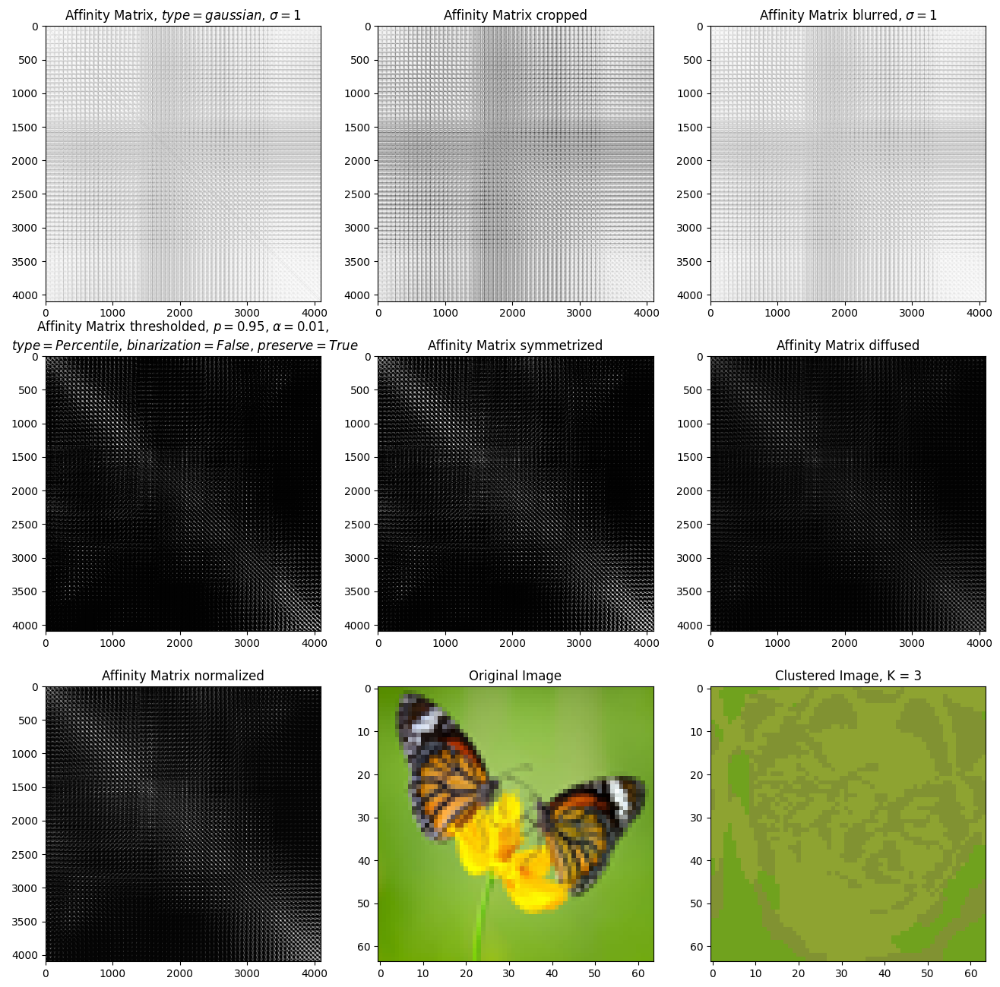



Experiment 4
{'affinity_type': 'cosine', 'sigma': 0.5, 'K': 20, 'sigma_gaussian_blur': 0.5, 'p_percentile': 0.99, 'thresholding_soft_multiplier': 0.01, 'thresholding_type': 'RowMax', 'thresholding_with_binarization': False, 'thresholding_preserve_diagonal': False, 'symmetrize_type': 'Average'}


C:\Users\KHADGA JYOTH ALLI\AppData\Local\Temp\ipykernel_22772\2939972276.py:167: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(affinity, np.transpose(affinity))


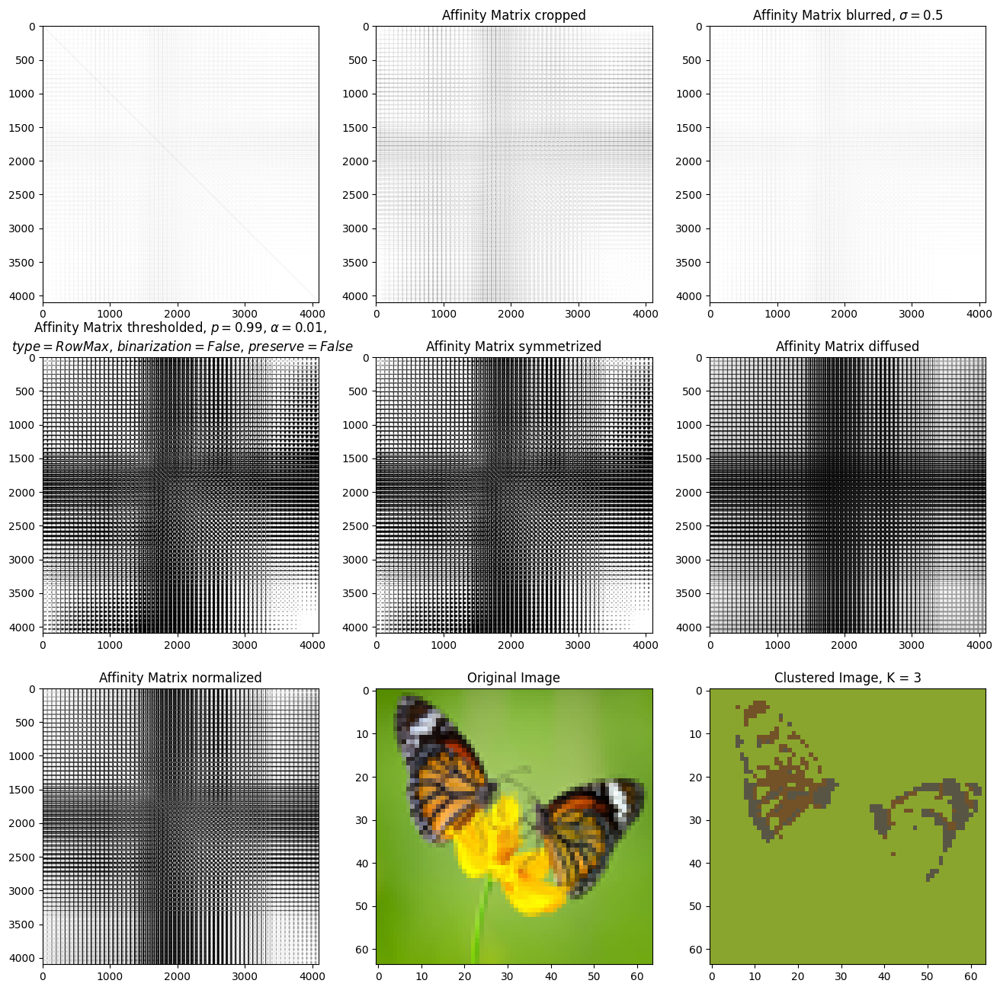



Experiment 5
{'affinity_type': 'gaussian', 'sigma': 0.5, 'K': 10, 'sigma_gaussian_blur': 0.1, 'p_percentile': 0.95, 'thresholding_soft_multiplier': 0.01, 'thresholding_type': 'Percentile', 'thresholding_with_binarization': False, 'thresholding_preserve_diagonal': True, 'symmetrize_type': 'Average'}


C:\Users\KHADGA JYOTH ALLI\AppData\Local\Temp\ipykernel_22772\2939972276.py:167: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(affinity, np.transpose(affinity))


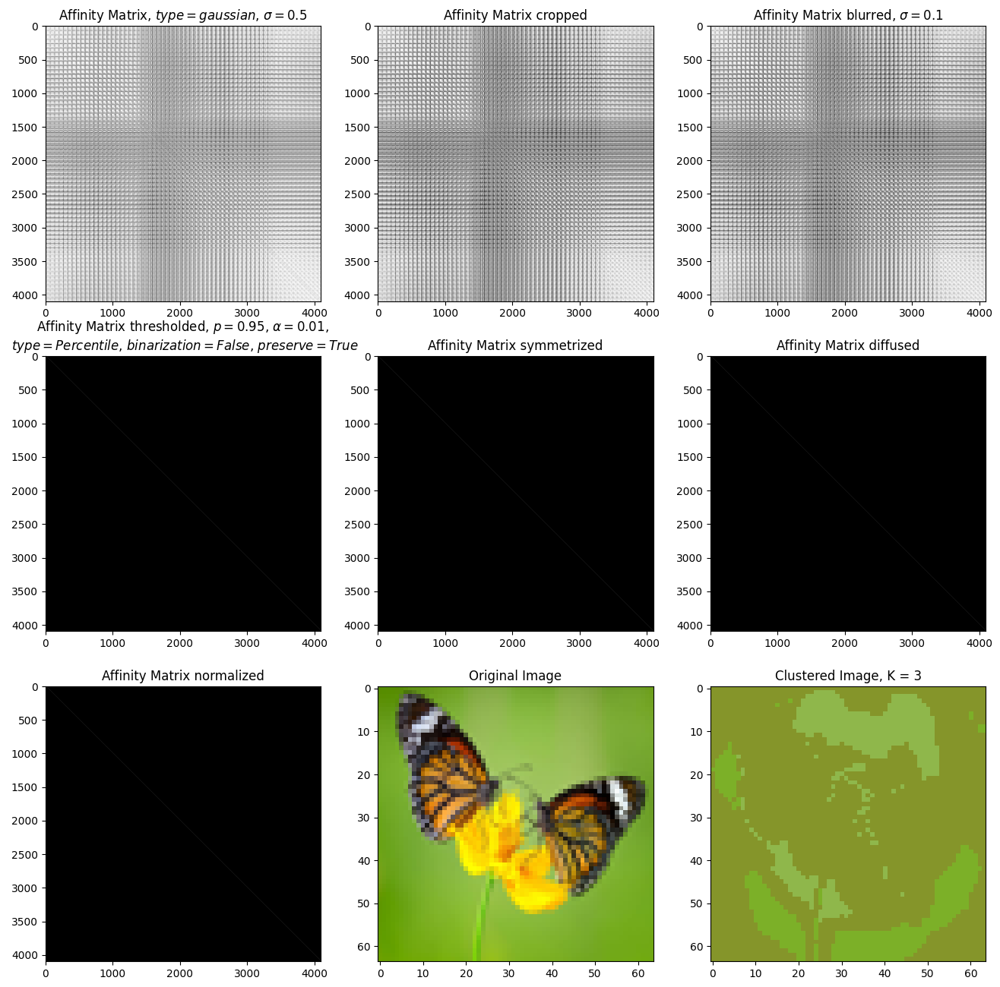

In [6]:

images_dir = './'
images_list = [os.path.join(images_dir,i) for i in os.listdir(images_dir) if (i.endswith('.jpg') or i.endswith('.png'))]

run_experiments = 5
print(f'Running {run_experiments} experiments on each image')
resize_height = 64
resize_width = 64

for image_path in images_list:
    print(f'Image Path: {image_path}')
    image = Image.open(image_path)
    plt.imshow(image)
    plt.show()
    image_resized = image.resize((resize_width, resize_height))
    image_resized = np.asarray(image_resized).astype(float)/255.0
    for i in range(run_experiments):
        print(f'Experiment {i+1}')
        experiment = experiments[i]
        print(experiment)
        RatioCut(image_resized, **experiment)
        print('\n')



# KMeans Clustering

Image Path: ./image1.jpg


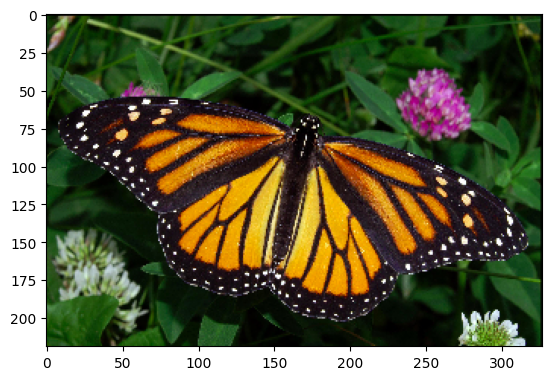

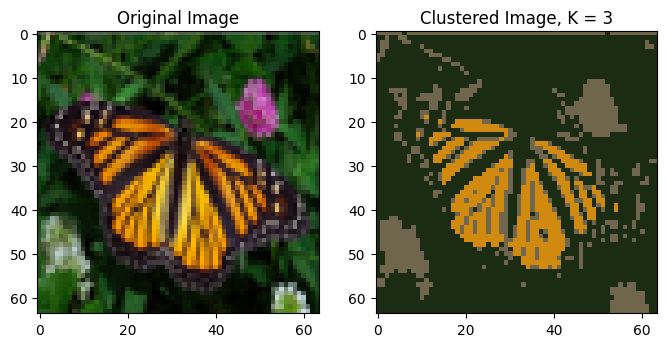

Image Path: ./image2.jpg


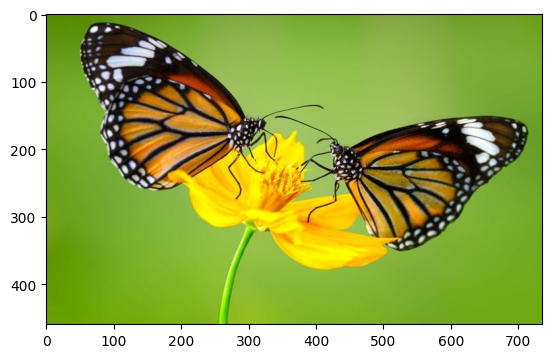

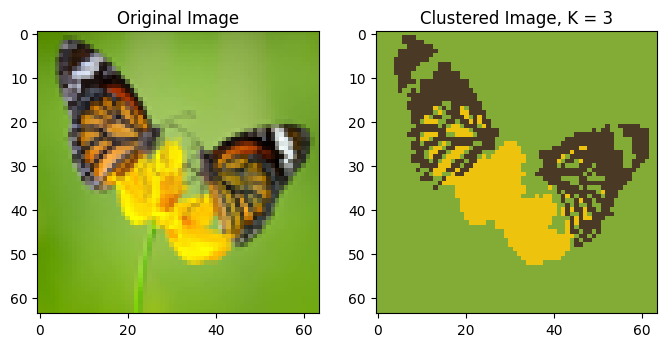

In [12]:

images_dir = './'
images_list = [os.path.join(images_dir,i) for i in os.listdir(images_dir) if (i.endswith('.jpg') or i.endswith('.png'))]

resize_height = 64
resize_width = 64

for image_path in images_list:
    print(f'Image Path: {image_path}')
    image = Image.open(image_path)
    plt.imshow(image)
    plt.show()
    image_resized = image.resize((resize_width, resize_height))
    image_resized = np.asarray(image_resized).astype(float)/255.0
    
    # Kmeans Clustering
    n_clusters = 3
    kmeans = KMeans(n_clusters=n_clusters, random_state=42,n_init='auto',init='k-means++').fit(image_resized.reshape(-1,3))
    clusters = kmeans.labels_.reshape(resize_height,resize_width)
    image_resized_clustered = np.zeros_like(image_resized)
    for i in range(n_clusters):
        image_resized_clustered[clusters == i] = image_resized[clusters == i].mean(axis=0)
    
    plt.figure(figsize=(8, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(image_resized)
    plt.title('Original Image')
    plt.subplot(1, 2, 2)
    plt.imshow(image_resized_clustered)
    plt.title('Clustered Image, K = ' + str(n_clusters))
    plt.show()